In [12]:
from activations import Activations

import numpy as np
import matplotlib.pyplot as plt

from gtda.diagrams import PairwiseDistance

import collections

from scipy.cluster.hierarchy import cut_tree, linkage
from scipy.spatial.distance import squareform as cdm

In [2]:
basepath = '../../trained_models/'
file = '10kbatches/steps_20_batch_200_RNN_512_relu_rf_012_DoG_True_plane_lr_00001_weight_decay_00001/activations.npy'
path = basepath + file

ratemaps = np.load(path)

activations = Activations(ratemaps)

In [3]:
sacs = activations.calculate_sacs()

In [4]:
dgms = activations.calculate_dgms(digits=2)

In [5]:
pairdis = PairwiseDistance(metric='silhouette',metric_params={'p':100},order=None)
D = pairdis.fit_transform(dgms)

/home/simone/anaconda3/envs/gc/lib/python3.7/site-packages/gtda/diagrams/_metrics.py:142: RuntimeWarning: invalid value encountered in true_divide
  fibers_weighted_sum = np.sum(weights*fibers, axis=1)/total_weights


In [14]:
D0 = D[:,:,0]
#condense distance matrix as a flat array
Df = cdm(D0)

In [15]:
Zc = linkage(Df,method='complete')
Za = linkage(Df,method='average')
Zw = linkage(Df,method='ward')
Zww = linkage(Df,method='weighted')
Zcc = linkage(Df,method='centroid')
Zm = linkage(Df,method='median')

In [16]:
cZc = cut_tree(Zc,3)
cZa = cut_tree(Za,3)
cZw = cut_tree(Zw,3)
cZww = cut_tree(Zww,3)
cZcc = cut_tree(Zcc,3)
cZm = cut_tree(Zm,3)

# Complete linkage

Cluster0


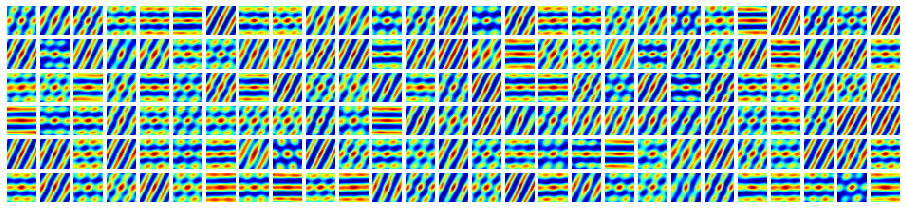

-------
Cluster1


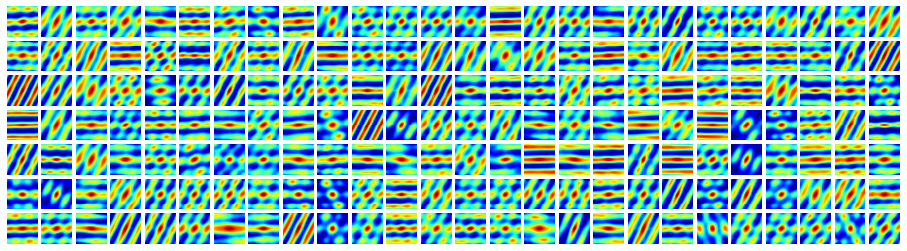

-------
Cluster2


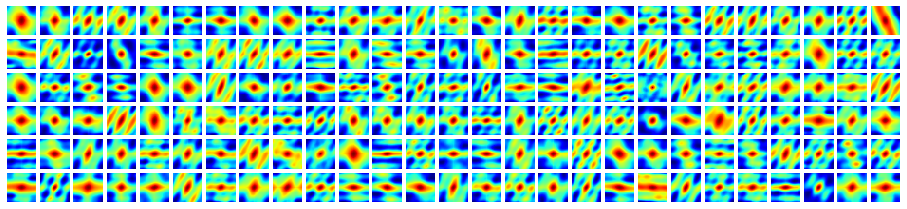

-------


In [19]:
activations.viz_clusters(cZc,activations.sacs_,n_col=25)

# Avarage linkage

Cluster0


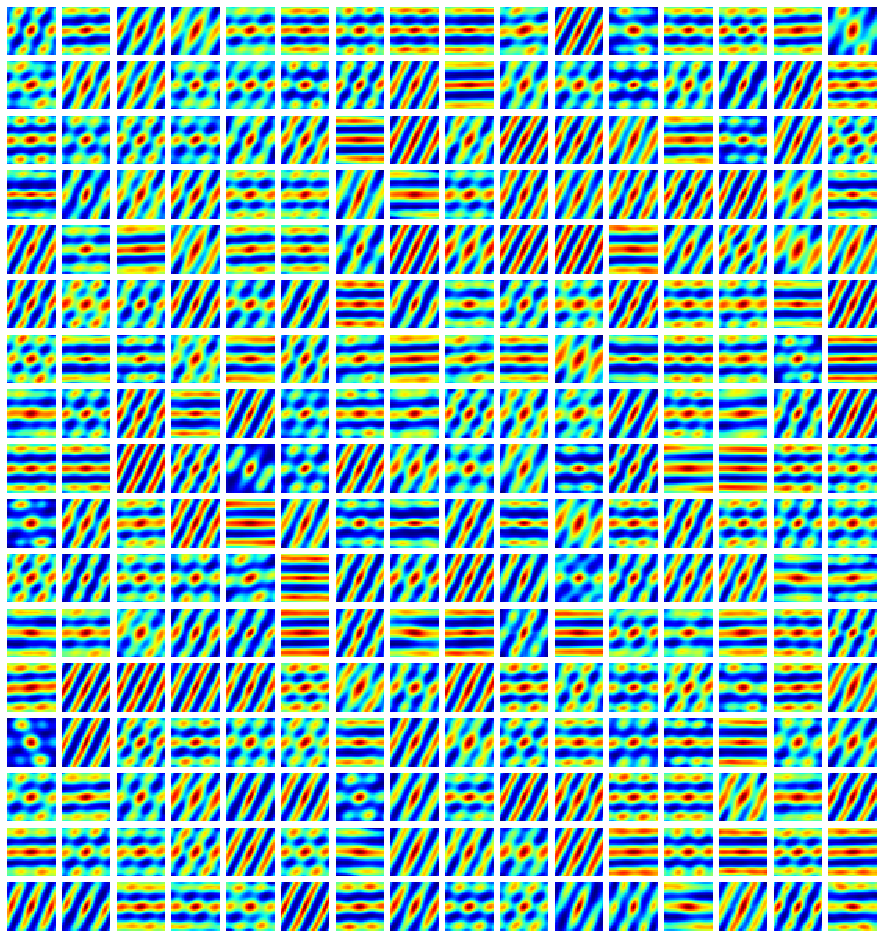

-------
Cluster1


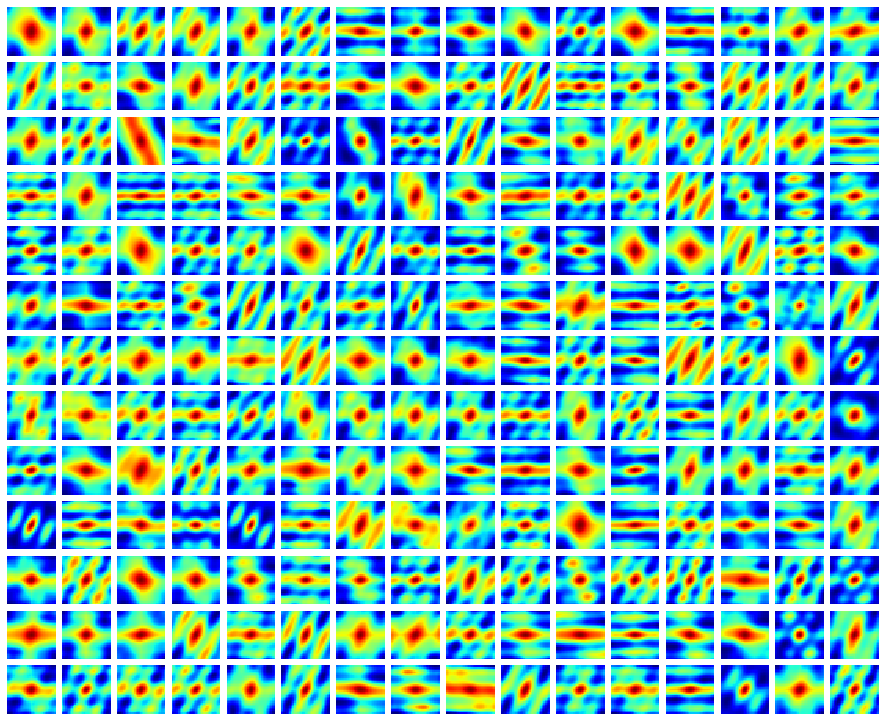

-------
Cluster2


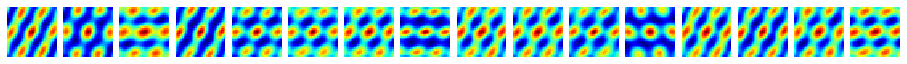

-------


In [24]:
activations.viz_clusters(cZa,activations.sacs_,n_col=16)

# Ward linkage

Cluster0


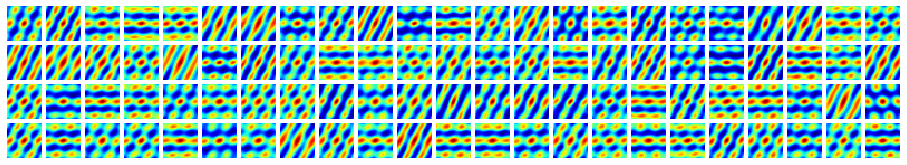

-------
Cluster1


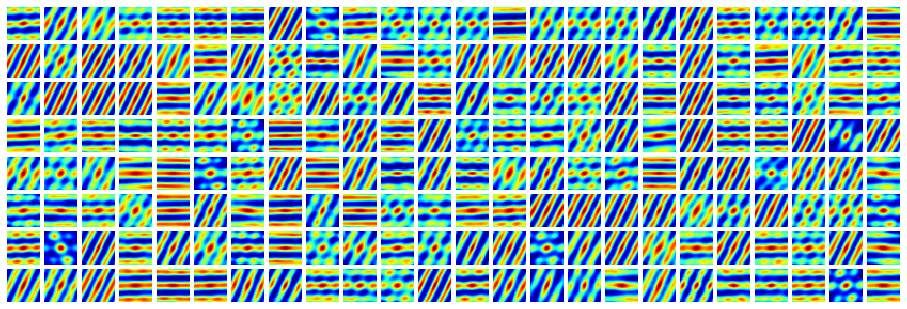

-------
Cluster2


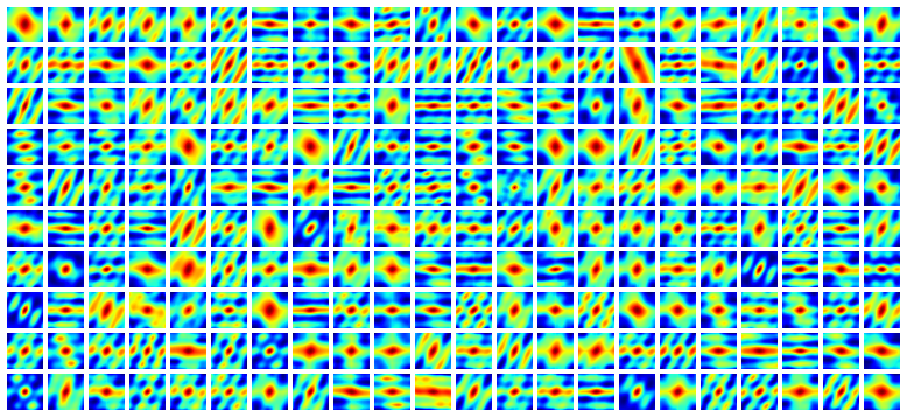

-------


In [47]:
activations.viz_clusters(cZw, activations.sacs_,n_col=22)

# Median linkage

Cluster0


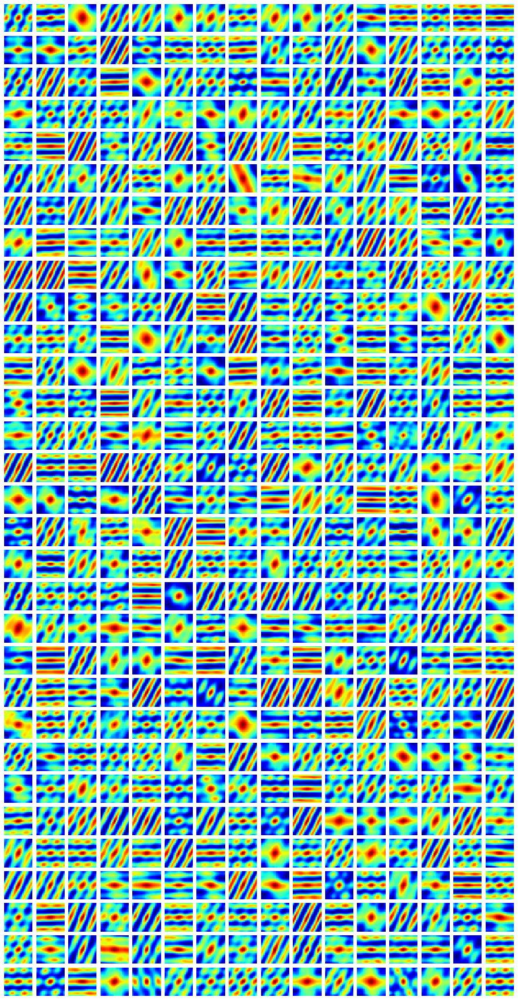

-------
Cluster1


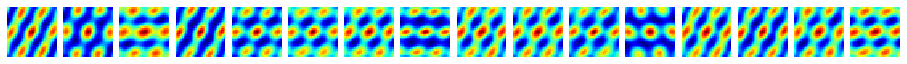

-------


In [38]:
activations.viz_clusters(cZm, activations.sacs_,n_col=16)

# Weighted linkage

Cluster0


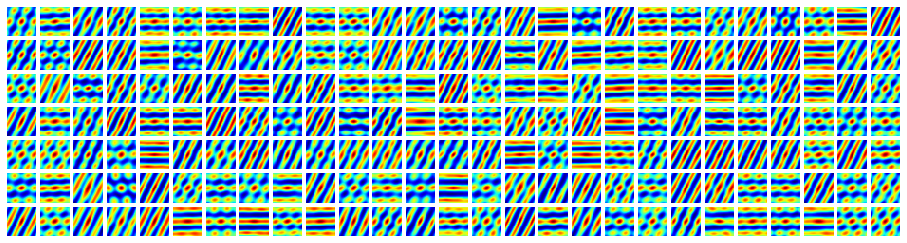

-------
Cluster1


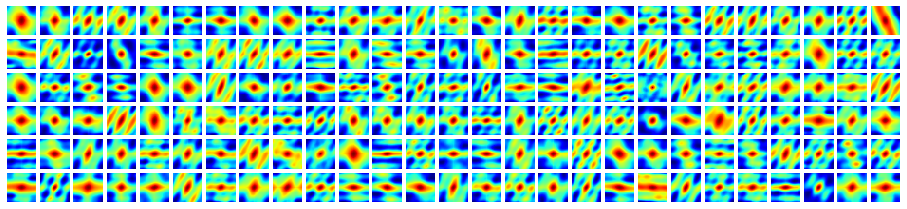

-------
Cluster2


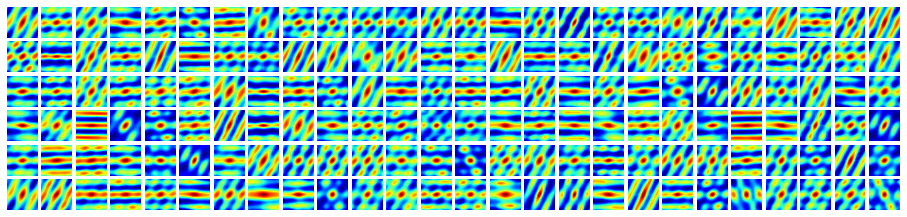

-------


In [39]:
activations.viz_clusters(cZww,activations.sacs_,n_col=25)

# Centroid linkage

Cluster0


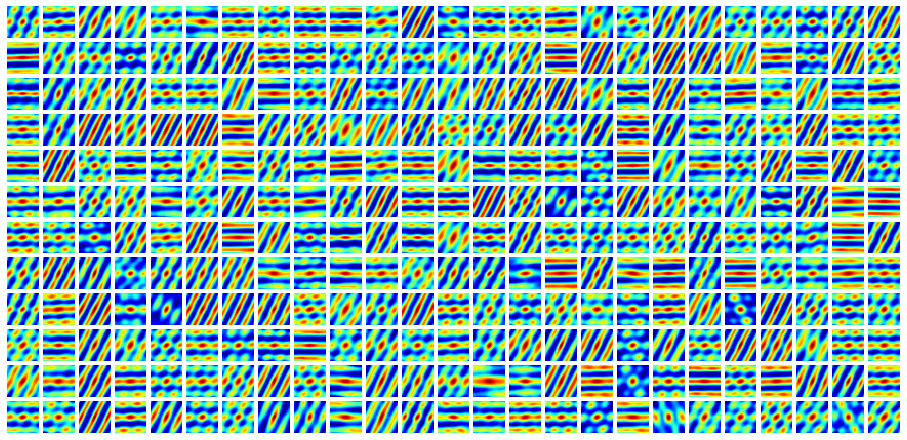

-------
Cluster1


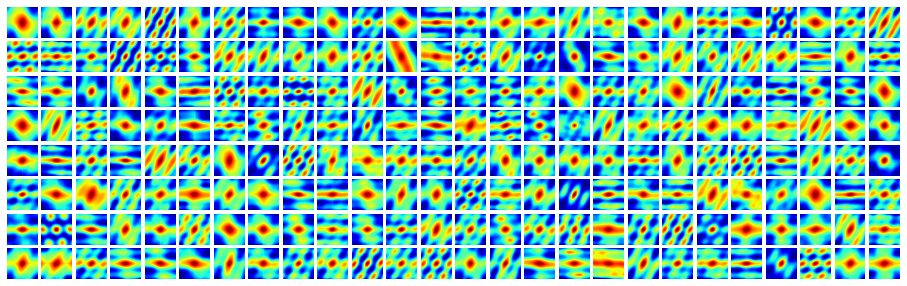

-------


In [40]:
activations.viz_clusters(cZcc, activations.sacs_,n_col=25)

# Ratemaps with weighted linkage

Cluster0


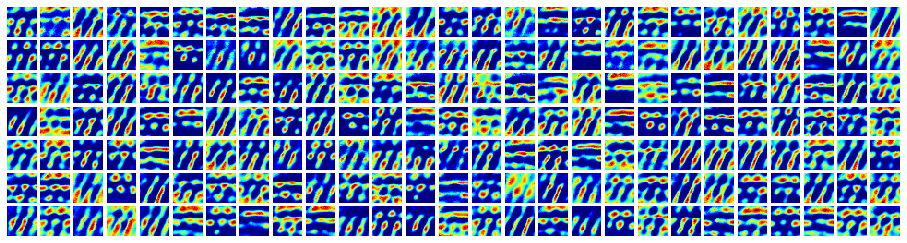

-------
Cluster1


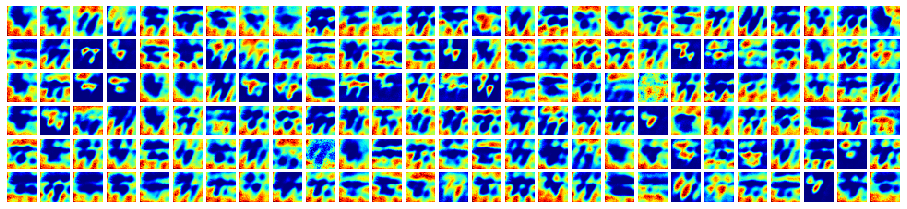

-------
Cluster2


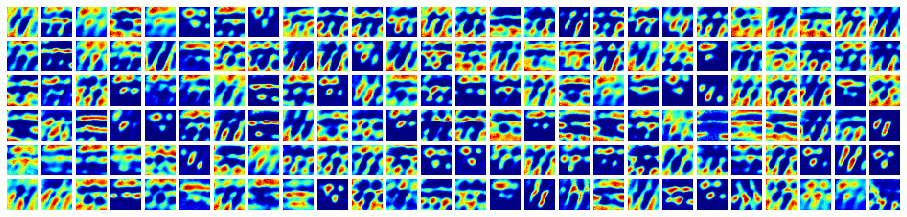

-------


In [42]:
activations.viz_clusters(cZww,activations.ratemaps_,n_col=25)

# Ratemaps with ward linkage

Cluster0


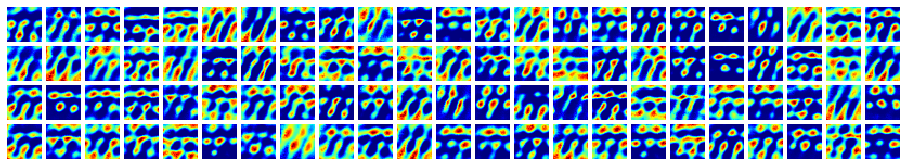

-------
Cluster1


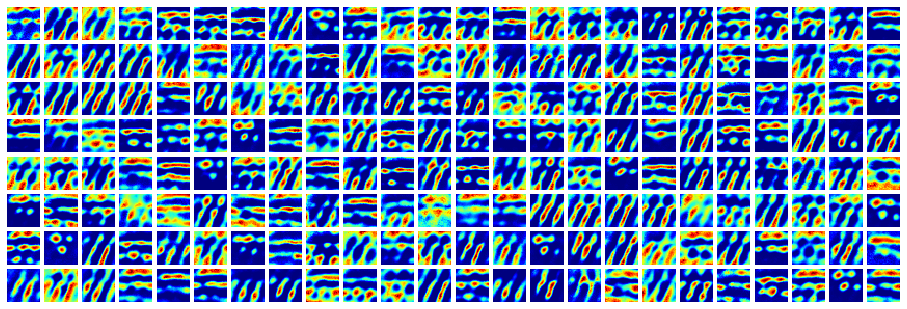

-------
Cluster2


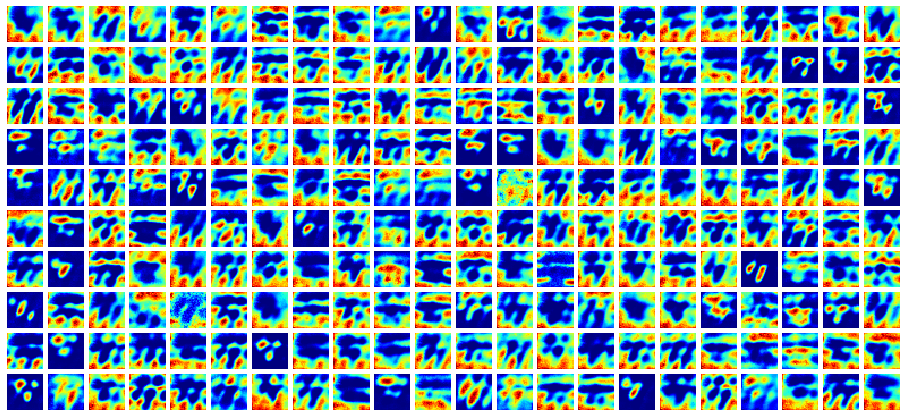

-------


In [48]:
activations.viz_clusters(cZw,activations.ratemaps_,n_col=22)